In [1]:
import numpy as np
import pandas as pd
pd.set_option('max_colwidth',50)
pd.set_option('max_columns',250)
pd.set_option('max_rows',500)

#visualizations
import folium
from folium import plugins
from folium.plugins import HeatMap
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns 
import cufflinks as cf
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools as tls
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from mpl_toolkits.basemap import Basemap
%matplotlib inline 
cf.go_offline()
cf.set_config_file(world_readable=True,theme='white') # Make all charts public and set a global theme
sns.set_style("whitegrid") #possible choices: white, dark, whitegrid, darkgrid, ticks

from functions import *

### Dataframes that will be used
<img src="imgs/dataframes_visually.png"/>

# Sardina Pilchardus

|    | Scientific name          | Common_name_GRE | Common_name_ENG        | Habitat       | Depth range (m) | Usual depth range (m) |
|----|--------------------------|-----------------|------------------------|---------------|-----------------|-----------------------|
|   | Sardina pilchardus       | Σαρδέλα         | European sardine       | Pelagic       | 10-100          | 25-100                |
<img src="imgs/sardina.jpg" alt="Sardina pilchardus" width="200px" align="center"/>

In [2]:
# panel data
sardinaPilchardus_panel = pd.read_csv('T:/ownCloud/ODYSSEA/Aquamaps/the16species_final/Sardina pilchardus.csv',index_col='Unnamed: 0')
print(sardinaPilchardus_panel.shape[0], 'rows')

71520 rows


In [3]:
sardinaPilchardus_panel.head()

,id,Genus,Species,Center Lat,Center Long,C-Square Code,Overall Probability,obs_id,temperatureSurface,year_month,temperature100_300,temperature300_400,temperature100_500,temperatureMaxDepth,salinitySurface,salinity100_300,salinity300_400,salinity100_500,salinityMaxDepth,dissolvedOxygenSurface,dissolvedOxygen100_300,dissolvedOxygen300_400,dissolvedOxygen100_500,dissolvedOxygenMaxDepth,meridionalCurrentSurface,meridionalCurrent100_300,meridionalCurrent300_400,meridionalCurrent100_500,meridionalCurrentMaxDepth,zonalCurrentSurface,zonalCurrent100_300,zonalCurrent300_400,zonalCurrent100_500,zonalCurrentMaxDepth,chlorophyll,EuphoticDepth,SecchiDiskDepth,wave_Height,nitrateSurface,nitrate100_300,nitrate300_400,nitrate100_500,nitrateMaxDepth,phosphateSurface,phosphate100_300,phosphate300_400,phosphate100_500,phosphateMaxDepth,DistanceToCoast,majorRiverDistance,majorRiversScale,bathymetry,substrateType,substrateOrigHabitat,substrateBiozone
0,02008-01,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,17.487333,2008-01,17.483358,17.483358,17.483358,17.483358,38.589620,38.589687,38.589687,38.589687,38.589687,215.00977,215.00972,215.00972,215.00972,215.00972,-0.004633,-0.004417,-0.004417,-0.004417,-0.004417,0.003990,0.003799,0.003799,0.003799,0.003799,0.091120,-0.787063,16.542532,0.364236,0.006429,0.006428,0.006428,0.006428,0.006428,0.003623,0.003623,0.003623,0.003623,0.003623,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
1,02008-02,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,16.356483,2008-02,16.323410,16.323410,16.323410,16.323410,38.357500,38.356500,38.356500,38.356500,38.356500,222.06847,222.06845,222.06845,222.06845,222.06845,0.000000,-0.004417,-0.004417,-0.004417,0.000000,0.000000,0.003799,0.003799,0.003799,0.000000,0.058834,-0.595206,14.983622,0.371151,0.005919,0.005919,0.005919,0.005919,0.005919,0.003703,0.003703,0.003703,0.003703,0.003703,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
2,02008-03,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,17.412617,2008-03,17.323942,17.323942,17.323942,17.323942,38.330997,38.329420,38.329420,38.329420,38.329420,222.28883,222.28891,222.28891,222.28891,222.28891,-0.018918,-0.017599,-0.017599,-0.017599,-0.017599,0.014905,0.015852,0.015852,0.015852,0.015852,0.088339,-0.858202,17.274120,0.173578,0.006872,0.006872,0.006872,0.006872,0.006872,0.003937,0.003937,0.003937,0.003937,0.003937,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
3,02008-04,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,18.664886,2008-04,18.580479,18.580479,18.580479,18.580479,38.356586,38.354680,38.354680,38.354680,38.354680,217.55254,217.55266,217.55266,217.55266,217.55266,-0.015815,-0.014742,-0.014742,-0.014742,-0.014742,0.014309,0.012531,0.012531,0.012531,0.012531,0.219484,-0.786224,20.733776,0.777014,0.006976,0.006975,0.006975,0.006975,0.006975,0.004803,0.004803,0.004803,0.004803,0.004803,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
4,02008-05,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,20.683325,2008-05,20.466887,20.466887,20.466887,20.466887,38.414630,38.409603,38.409603,38.409603,38.409603,211.78080,212.11305,212.11305,212.11305,212.11305,-0.010033,-0.009926,-0.009926,-0.009926,-0.009926,0.009827,0.007829,0.007829,0.007829,0.007829,0.079540,-0.866522,21.826303,0.296160,0.007796,0.007209,0.007209,0.007209,0.007209,0.004959,0.004966,0.004966,0.004966,0.004966,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral


### Create a new dataset with the mean value of each observation. This is the mean of 120 months.

In [4]:
### Create some lists that will be useful
static_cols = ['majorRiverDistance', 'majorRiversScale', 'bathymetry', 'substrateType','substrateOrigHabitat', 'substrateBiozone']
temporal_cols = ['temperatureSurface','temperature100_300', 'temperature300_400', 'temperature100_500','temperatureMaxDepth', 'salinitySurface', 'salinity100_300','salinity300_400', 'salinity100_500', 'salinityMaxDepth','dissolvedOxygenSurface', 'dissolvedOxygen100_300','dissolvedOxygen300_400', 'dissolvedOxygen100_500','dissolvedOxygenMaxDepth', 'meridionalCurrentSurface','meridionalCurrent100_300', 'meridionalCurrent300_400','meridionalCurrent100_500', 'meridionalCurrentMaxDepth','zonalCurrentSurface', 'zonalCurrent100_300', 'zonalCurrent300_400','zonalCurrent100_500', 'zonalCurrentMaxDepth', 'chlorophyll','EuphoticDepth', 'SecchiDiskDepth', 'wave_Height', 'nitrateSurface','nitrate100_300', 'nitrate300_400', 'nitrate100_500', 'nitrateMaxDepth','phosphateSurface', 'phosphate100_300', 'phosphate300_400','phosphate100_500', 'phosphateMaxDepth']


sardinaPilchardus = pd.DataFrame()
for c in sardinaPilchardus_panel.columns:
    if c in temporal_cols:
        sardinaPilchardus[c] = sardinaPilchardus_panel.groupby('obs_id')[c].mean()
        #sardinaPilchardus[c+'_mean'] = sardinaPilchardus_panel.groupby('obs_id')[c].mean()
    if c in static_cols:
        sardinaPilchardus[c] = sardinaPilchardus_panel.groupby('obs_id')[c].agg(lambda x:x.value_counts().index[0])
    if c in ['Center Lat','Center Long']:
        sardinaPilchardus[c] = sardinaPilchardus_panel.groupby('obs_id')[c].agg(lambda x:x.value_counts().index[0])
        
pelagic = [sardinaPilchardus]
pelagic_name = ['Sardina Pilchardus']

In [5]:
print(sardinaPilchardus.shape[0], 'rows and ', sardinaPilchardus.shape[1], 'columns')
sardinaPilchardus.head()

596 rows and  47 columns


,Center Lat,Center Long,temperatureSurface,temperature100_300,temperature300_400,temperature100_500,temperatureMaxDepth,salinitySurface,salinity100_300,salinity300_400,salinity100_500,salinityMaxDepth,dissolvedOxygenSurface,dissolvedOxygen100_300,dissolvedOxygen300_400,dissolvedOxygen100_500,dissolvedOxygenMaxDepth,meridionalCurrentSurface,meridionalCurrent100_300,meridionalCurrent300_400,meridionalCurrent100_500,meridionalCurrentMaxDepth,zonalCurrentSurface,zonalCurrent100_300,zonalCurrent300_400,zonalCurrent100_500,zonalCurrentMaxDepth,chlorophyll,EuphoticDepth,SecchiDiskDepth,wave_Height,nitrateSurface,nitrate100_300,nitrate300_400,nitrate100_500,nitrateMaxDepth,phosphateSurface,phosphate100_300,phosphate300_400,phosphate100_500,phosphateMaxDepth,majorRiverDistance,majorRiversScale,bathymetry,substrateType,substrateOrigHabitat,substrateBiozone
obs_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,30.75,17.75,22.373630,22.287897,22.287897,22.287897,22.287897,38.681165,38.677997,38.677997,38.677997,38.677997,203.782252,203.827622,203.827622,203.827622,203.827622,-0.007706,-0.004464,-0.004464,-0.004464,-0.003790,0.001265,0.006029,0.006029,0.006029,0.005456,0.076297,-0.849596,17.455139,0.754740,0.008334,0.008199,0.008199,0.008199,0.008199,0.004733,0.004730,0.004730,0.004730,0.004730,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
1.0,30.25,18.75,22.510767,22.427538,22.427538,22.427538,22.427538,38.713629,38.710803,38.710803,38.710803,38.710803,203.325312,203.339973,203.339973,203.339973,203.339973,-0.012922,-0.006547,-0.006547,-0.006547,-0.005820,0.004533,0.009059,0.009059,0.009059,0.008436,0.091061,-0.775473,26.143833,0.682463,0.007571,0.007483,0.007483,0.007483,0.007483,0.004742,0.004740,0.004740,0.004740,0.004740,1140.799940,8.0,-5.398390,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
2.0,30.75,18.75,22.382202,15.951561,15.951561,15.951561,15.951561,38.591174,38.666155,38.666155,38.666155,38.666155,201.167671,205.948226,205.948226,205.948226,205.948226,-0.007238,-0.000512,-0.000512,-0.000512,-0.000470,-0.040264,-0.004074,-0.004074,-0.004074,-0.004464,0.058189,-0.965681,29.638900,1.006145,0.014478,1.564791,1.564791,1.564791,1.564791,0.006094,0.094106,0.094106,0.094106,0.094106,1085.905121,8.0,-71.006104,Muddy sand,A5.23: Infralittoral fine sands,Infralittoral
3.0,30.25,19.25,22.485016,22.335924,22.335924,22.335924,22.335924,38.738440,38.731926,38.731926,38.731926,38.731926,200.794471,200.986942,200.986942,200.986942,200.986942,-0.004965,0.007940,0.007940,0.007940,0.007571,0.003256,0.007635,0.007635,0.007635,0.006999,0.112878,-0.582461,28.995374,0.805212,0.006738,0.006287,0.006287,0.006287,0.006287,0.004530,0.004524,0.004524,0.004524,0.004524,1103.186667,7.0,-7.016480,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
4.0,30.25,19.75,22.514297,22.218005,22.218005,22.218005,22.218005,38.715601,38.699159,38.699159,38.699159,38.699159,200.720580,201.778111,201.778111,201.778111,201.778111,-0.009709,0.006801,0.006801,0.006801,0.006443,-0.000942,0.004769,0.004769,0.004769,0.004482,0.162869,-0.739931,18.330527,0.813227,0.008591,0.006534,0.006534,0.006534,0.006534,0.004749,0.004657,0.004657,0.004657,0.004657,1055.413182,7.0,-6.413780,Muddy sand,A5.23: Infralittoral fine sands,Infralittoral


## Temperature

In [6]:
get_stats(sardinaPilchardus, sort_by='Mean', sort_how=False, include_only=[c for c in sardinaPilchardus if 'temperature' in c])

Your selected dataframe has 5 columns. (0 categorical and 5 numerical).
There are 0 columns that have missing values, of which 0 have over 90%!
0 object type columns have less than 5 different values and you can consider one-hot encoding, while 0 have more than 5 colums and you can consider label encoding.
4 columns are highly positively skewed (skewness>1), while 0 columns are highly negatively skewed (skewness<-1).
5 columns are symmetrical (-0.5<skewness<0.5).
0 columns have high kurtosis (kurtosis>3) and should be check for outliers, while 5 columns have low kurtosis (kurtosis<3). 


,Type,Different Values,Most Common,% of Most Common,Skewness,Kurtosis,Mean,Min,25% quantile,Median,75% quantile,Max,Missing Values,% of Missing Values
Name,,,,,,,,,,,,,,
temperatureSurface,float64,582,17.580020,0.671141,0.304352,0.035650,19.945594,15.052781,18.954670,19.718877,20.742275,23.591479,0,0.0
temperature100_300,float64,578,13.340175,0.671141,1.059039,0.416230,16.189127,11.977197,14.386262,15.430706,17.566502,23.489089,0,0.0
temperature300_400,float64,580,14.717940,0.671141,1.099925,0.408620,16.051324,11.977197,14.210323,15.198221,17.508607,23.489089,0,0.0
temperature100_500,float64,582,13.340175,0.671141,1.114732,0.394688,15.974469,11.977197,14.086748,15.029283,17.504647,23.489089,0,0.0
temperatureMaxDepth,float64,582,14.717940,0.671141,1.070715,0.233067,15.807662,11.977197,13.622285,14.818341,17.494714,23.489089,0,0.0


In [7]:
plot_univariate(sardinaPilchardus['temperatureSurface'], 'Sardina Pilchardus Τemperature (Surface)')
plot_univariate(sardinaPilchardus['temperatureMaxDepth'], 'Sardina Pilchardus Τemperature (Seabed)')

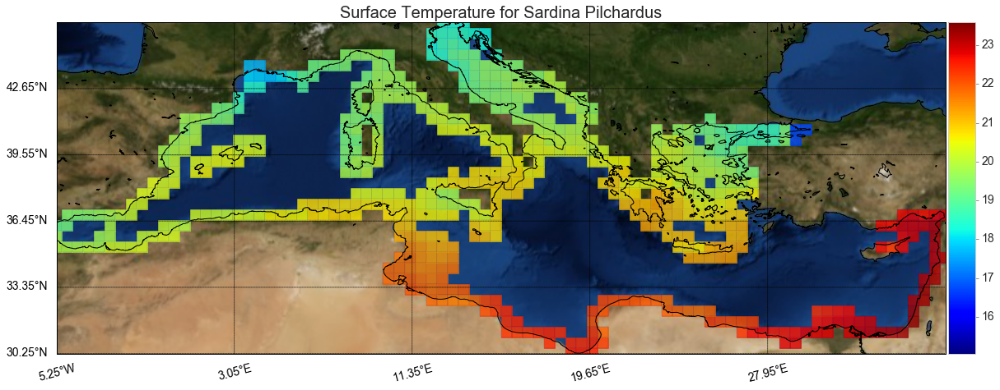

In [8]:
plot_map(sardinaPilchardus,'temperatureSurface','Surface Temperature for Sardina Pilchardus')

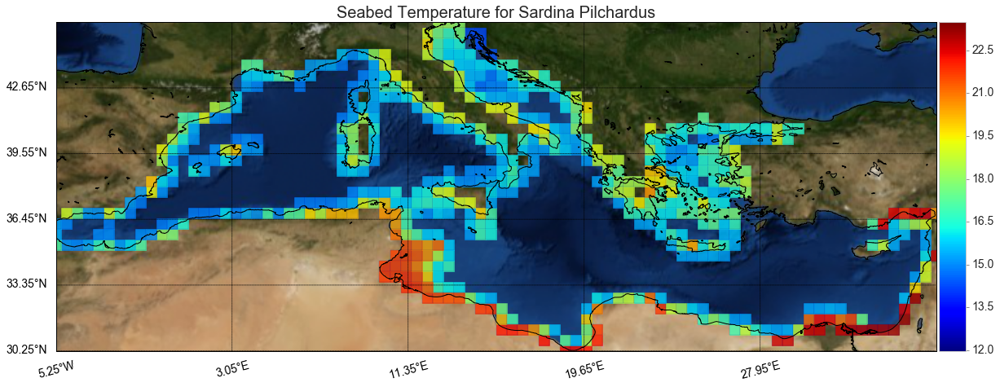

In [9]:
plot_map(sardinaPilchardus,'temperatureMaxDepth','Seabed Temperature for Sardina Pilchardus')

### Time Series Analysis

In [10]:
sardinaPilchardus_panel['year_month'] = pd.to_datetime(sardinaPilchardus_panel['year_month'])
sardinaPilchardus_panel['year'] = sardinaPilchardus_panel['year_month'].dt.year
sardinaPilchardus_panel['month'] = sardinaPilchardus_panel['year_month'].dt.month

### Group by each observation and each year. For example for obs 1 and year 2008, for obs 1 and year 2009 .. for obs 595 and year 2017
sardinaPilchardus_perYear = pd.DataFrame()
for c in sardinaPilchardus_panel.columns:
    if c in temporal_cols:
        sardinaPilchardus_perYear[c] = sardinaPilchardus_panel.groupby(['obs_id','year'])[c].mean()
    if c in static_cols:
        sardinaPilchardus_perYear[c] = sardinaPilchardus_panel.groupby(['obs_id','year'])[c].agg(lambda x:x.value_counts().index[0])
    if c in ['Center Lat','Center Long']:
        sardinaPilchardus_perYear[c] = sardinaPilchardus_panel.groupby(['obs_id','year'])[c].agg(lambda x:x.value_counts().index[0])

### Group by each observation and each month. For example for obs 1 and month 1, for obs 1 and month 2 .. for obs 595 and month 12
sardinaPilchardus_perMonth = pd.DataFrame()
for c in sardinaPilchardus_panel.columns:
    if c in temporal_cols:
        sardinaPilchardus_perMonth[c] = sardinaPilchardus_panel.groupby(['obs_id','month'])[c].mean()
    if c in static_cols:
        sardinaPilchardus_perMonth[c] = sardinaPilchardus_panel.groupby(['obs_id','month'])[c].agg(lambda x:x.value_counts().index[0])
    if c in ['Center Lat','Center Long']:
        sardinaPilchardus_perMonth[c] = sardinaPilchardus_panel.groupby(['obs_id','month'])[c].agg(lambda x:x.value_counts().index[0])
         
sardinaPilchardus_panel.head()

,id,Genus,Species,Center Lat,Center Long,C-Square Code,Overall Probability,obs_id,temperatureSurface,year_month,temperature100_300,temperature300_400,temperature100_500,temperatureMaxDepth,salinitySurface,salinity100_300,salinity300_400,salinity100_500,salinityMaxDepth,dissolvedOxygenSurface,dissolvedOxygen100_300,dissolvedOxygen300_400,dissolvedOxygen100_500,dissolvedOxygenMaxDepth,meridionalCurrentSurface,meridionalCurrent100_300,meridionalCurrent300_400,meridionalCurrent100_500,meridionalCurrentMaxDepth,zonalCurrentSurface,zonalCurrent100_300,zonalCurrent300_400,zonalCurrent100_500,zonalCurrentMaxDepth,chlorophyll,EuphoticDepth,SecchiDiskDepth,wave_Height,nitrateSurface,nitrate100_300,nitrate300_400,nitrate100_500,nitrateMaxDepth,phosphateSurface,phosphate100_300,phosphate300_400,phosphate100_500,phosphateMaxDepth,DistanceToCoast,majorRiverDistance,majorRiversScale,bathymetry,substrateType,substrateOrigHabitat,substrateBiozone,year,month
0,02008-01,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,17.487333,2008-01-01,17.483358,17.483358,17.483358,17.483358,38.589620,38.589687,38.589687,38.589687,38.589687,215.00977,215.00972,215.00972,215.00972,215.00972,-0.004633,-0.004417,-0.004417,-0.004417,-0.004417,0.003990,0.003799,0.003799,0.003799,0.003799,0.091120,-0.787063,16.542532,0.364236,0.006429,0.006428,0.006428,0.006428,0.006428,0.003623,0.003623,0.003623,0.003623,0.003623,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral,2008,1
1,02008-02,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,16.356483,2008-02-01,16.323410,16.323410,16.323410,16.323410,38.357500,38.356500,38.356500,38.356500,38.356500,222.06847,222.06845,222.06845,222.06845,222.06845,0.000000,-0.004417,-0.004417,-0.004417,0.000000,0.000000,0.003799,0.003799,0.003799,0.000000,0.058834,-0.595206,14.983622,0.371151,0.005919,0.005919,0.005919,0.005919,0.005919,0.003703,0.003703,0.003703,0.003703,0.003703,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral,2008,2
2,02008-03,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,17.412617,2008-03-01,17.323942,17.323942,17.323942,17.323942,38.330997,38.329420,38.329420,38.329420,38.329420,222.28883,222.28891,222.28891,222.28891,222.28891,-0.018918,-0.017599,-0.017599,-0.017599,-0.017599,0.014905,0.015852,0.015852,0.015852,0.015852,0.088339,-0.858202,17.274120,0.173578,0.006872,0.006872,0.006872,0.006872,0.006872,0.003937,0.003937,0.003937,0.003937,0.003937,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral,2008,3
3,02008-04,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,18.664886,2008-04-01,18.580479,18.580479,18.580479,18.580479,38.356586,38.354680,38.354680,38.354680,38.354680,217.55254,217.55266,217.55266,217.55266,217.55266,-0.015815,-0.014742,-0.014742,-0.014742,-0.014742,0.014309,0.012531,0.012531,0.012531,0.012531,0.219484,-0.786224,20.733776,0.777014,0.006976,0.006975,0.006975,0.006975,0.006975,0.004803,0.004803,0.004803,0.004803,0.004803,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral,2008,4
4,02008-05,Sardina,pilchardus,30.75,17.75,1301:207:4,0.12,0.0,20.683325,2008-05-01,20.466887,20.466887,20.466887,20.466887,38.414630,38.409603,38.409603,38.409603,38.409603,211.78080,212.11305,212.11305,212.11305,212.11305,-0.010033,-0.009926,-0.009926,-0.009926,-0.009926,0.009827,0.007829,0.007829,0.007829,0.007829,0.079540,-0.866522,21.826303,0.296160,0.007796,0.007209,0.007209,0.007209,0.007209,0.004959,0.004966,0.004966,0.004966,0.004966,18.893757,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral,2008,5


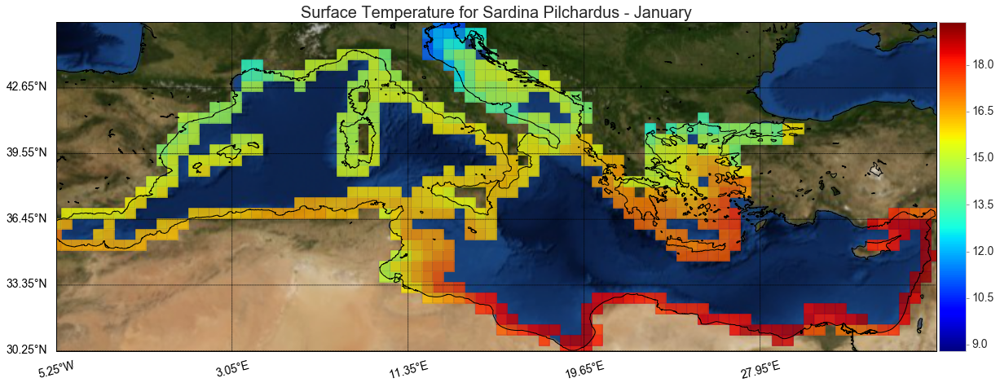

In [11]:
plot_map(sardinaPilchardus_perMonth.xs(1, level=1, drop_level=False),'temperatureSurface','Surface Temperature for Sardina Pilchardus - January', saveFig=True)

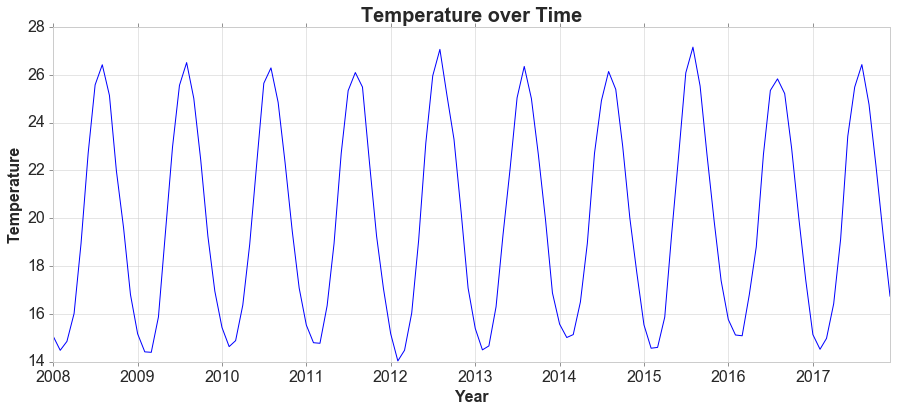

In [594]:
fig, ax = plt.subplots(figsize=(15, 6))
d = sardinaPilchardus_panel[sardinaPilchardus_panel['obs_id']==2]
sns.lineplot(sardinaPilchardus_.index, sardinaPilchardus_['temperatureSurface'] )

ax.set_title('Temperature over Time', fontsize = 20, loc='center', fontdict=dict(weight='bold'))
ax.set_xlabel('Year', fontsize = 16, fontdict=dict(weight='bold'))
ax.set_ylabel('Temperature', fontsize = 16, fontdict=dict(weight='bold'))
plt.tick_params(axis='y', which='major', labelsize=16)
plt.tick_params(axis='x', which='major', labelsize=16)
ax.yaxis.tick_left() # where the y axis marks will be

In [60]:
sardinaPilchardus_perMonth.head(500)

Center Lat  Center Long  temperatureSurface  temperature100_300  \
obs_id month                                                                    
0.0    1           30.75        17.75           17.740097           17.732998   
       2           30.75        17.75           16.856263           16.826671   
       3           30.75        17.75           17.344742           17.277064   
       4           30.75        17.75           18.788032           18.675606   
       5           30.75        17.75           20.970194           20.773255   
       6           30.75        17.75           24.020686           23.770063   
       7           30.75        17.75           27.315266           27.136783   
       8           30.75        17.75           28.743521           28.659962   
       9           30.75        17.75           28.031227           27.972141   
       10          30.75        17.75           25.826414           25.798221   
       11          30.75        17.75           22.941266           22.930431   
       12          30.75        17.75           19.905854           19.901567   
1.0    1           30.25        18.75           18.127050           18.121875   
       2           30.25        18.75           17.176086           17.149075   
       3           30.25        18.75           17.519281           17.441874   
       4           30.25        18.75           18.991156           18.852691   
       5           30.25        18.75           21.182587           20.964047   
       6           30.25        18.75           24.192321           23.972294   
       7           30.25        18.75           27.154952           27.022308   
       8           30.25        18.75           28.558486           28.481785   
       9           30.25        18.75           28.058431           27.995670   
       10          30.25        18.75           25.904200           25.875729   
       11          30.25        18.75           23.036477           23.028012   
       12          30.25        18.75           20.228179           20.225092   
2.0    1           30.75        18.75           18.956089           16.635167   
       2           30.75        18.75           17.826164           16.749788   
       3           30.75        18.75           17.594432           16.513822   
       4           30.75        18.75           18.486139           16.212285   
       5           30.75        18.75           20.469718           16.023040   
       6           30.75        18.75           23.320942           15.802507   
       7           30.75        18.75           26.242952           15.697826   
       8           30.75        18.75           27.718287           15.555030   
       9           30.75        18.75           27.555613           15.536767   
       10          30.75        18.75           25.881075           15.503016   
       11          30.75        18.75           23.518749           15.471284   
       12          30.75        18.75           21.016259           15.718200   
3.0    1           30.25        19.25           18.127626           18.118310   
       2           30.25        19.25           17.182835           17.142284   
       3           30.25        19.25           17.525702           17.422527   
       4           30.25        19.25           18.945762           18.738234   
       5           30.25        19.25           21.152573           20.745363   
       6           30.25        19.25           24.054425           23.560675   
       7           30.25        19.25           27.092580           26.862315   
       8           30.25        19.25           28.544998           28.448463   
       9           30.25        19.25           27.962100           27.827677   
       10          30.25        19.25           25.868285           25.820612   
       11          30.25        19.25           23.092101           23.078673   
       12          30.25        19.25        

In [39]:
sardinaPilchardus2.xs(2008, level=1, drop_level=False)

,,Center Lat,Center Long,temperatureSurface,temperature100_300,temperature300_400,temperature100_500,temperatureMaxDepth,salinitySurface,salinity100_300,salinity300_400,salinity100_500,salinityMaxDepth,dissolvedOxygenSurface,dissolvedOxygen100_300,dissolvedOxygen300_400,dissolvedOxygen100_500,dissolvedOxygenMaxDepth,meridionalCurrentSurface,meridionalCurrent100_300,meridionalCurrent300_400,meridionalCurrent100_500,meridionalCurrentMaxDepth,zonalCurrentSurface,zonalCurrent100_300,zonalCurrent300_400,zonalCurrent100_500,zonalCurrentMaxDepth,chlorophyll,EuphoticDepth,SecchiDiskDepth,wave_Height,nitrateSurface,nitrate100_300,nitrate300_400,nitrate100_500,nitrateMaxDepth,phosphateSurface,phosphate100_300,phosphate300_400,phosphate100_500,phosphateMaxDepth,majorRiverDistance,majorRiversScale,bathymetry,substrateType,substrateOrigHabitat,substrateBiozone
obs_id,year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,2008,30.75,17.75,22.245877,22.150767,22.150767,22.150767,22.150767,38.665467,38.661578,38.661578,38.661578,38.661578,202.921459,203.030438,203.030438,203.030438,203.030438,-0.004047,-0.001472,-0.001472,-0.001472,-0.001103,-0.000855,0.003204,0.003204,0.003204,0.002887,0.099113,-0.835519,18.835581,0.532176,0.008048,0.007838,0.007838,0.007838,0.007838,0.004555,0.004548,0.004548,0.004548,0.004548,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
1.0,2008,30.25,18.75,22.330310,22.257485,22.257485,22.257485,22.257485,38.724812,38.722326,38.722326,38.722326,38.722326,201.830806,201.855672,201.855672,201.855672,201.855672,-0.009385,-0.005039,-0.005039,-0.005039,-0.004250,0.003059,0.007112,0.007112,0.007112,0.006431,0.076591,-0.765873,26.341065,0.516102,0.007446,0.007391,0.007391,0.007391,0.007391,0.004450,0.004449,0.004449,0.004449,0.004449,1140.799940,8.0,-5.398390,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
2.0,2008,30.75,18.75,22.313356,16.031008,16.031008,16.031008,16.031008,38.680292,38.660945,38.660945,38.660945,38.660945,201.000700,205.517463,205.517463,205.517463,205.517463,-0.012189,0.000064,0.000064,0.000064,-0.000020,-0.031988,-0.002485,-0.002485,-0.002485,-0.003956,0.056989,-0.976252,29.755173,0.757885,0.018937,1.520760,1.520760,1.520760,1.520760,0.005918,0.086503,0.086503,0.086503,0.086503,1085.905121,8.0,-71.006104,Muddy sand,A5.23: Infralittoral fine sands,Infralittoral
3.0,2008,30.25,19.25,22.322066,22.134623,22.134623,22.134623,22.134623,38.753265,38.744909,38.744909,38.744909,38.744909,201.943924,202.309825,202.309825,202.309825,202.309825,-0.005029,0.006304,0.006304,0.006304,0.005905,-0.000264,0.004840,0.004840,0.004840,0.004186,0.129285,-0.624803,28.765121,0.582944,0.006510,0.005783,0.005783,0.005783,0.005783,0.004265,0.004240,0.004240,0.004240,0.004240,1103.186667,7.0,-7.016480,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
4.0,2008,30.25,19.75,22.361402,22.014606,22.014606,22.014606,22.014606,38.749770,38.732806,38.732806,38.732806,38.732806,201.090943,202.487076,202.487076,202.487076,202.487076,-0.007967,0.007006,0.007006,0.007006,0.006349,0.000118,0.004455,0.004455,0.004455,0.003889,0.182028,-0.770008,18.947451,0.577453,0.006565,0.004266,0.004266,0.004266,0.004266,0.004399,0.004268,0.004268,0.004268,0.004268,1055.413182,7.0,-6.413780,Muddy sand,A5.23: Infralittoral fine sands,Infralittoral
5.0,2008,30.75,19.75,22.300927,17.582498,17.582498,17.582498,17.582498,38.735966,38.584034,38.584034,38.584034,38.584034,200.983722,213.603919,213.603919,213.603919,213.603919,-0.001917,0.005450,0.005450,0.005450,0.003804,0.004134,0.000285,0.000285,0.000285,-0.000298,0.055779,-0.975452,28.615144,0.715240,0.019931,0.099559,0.099559,0.099559,0.099559,0.005068,0.015348,0.015348,0.015348,0.015348,1051.145484,7.0,-99.404503,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
6.0,2008,31.25,15.75,22.164141,22.084192,22.084192,22.084192,22.084192,38.440931,38.438606,38.438606,38.438606,38.438606,204.483736,204.483844,20

In [40]:
sardinaPilchardus

,Center Lat,Center Long,temperatureSurface,temperature100_300,temperature300_400,temperature100_500,temperatureMaxDepth,salinitySurface,salinity100_300,salinity300_400,salinity100_500,salinityMaxDepth,dissolvedOxygenSurface,dissolvedOxygen100_300,dissolvedOxygen300_400,dissolvedOxygen100_500,dissolvedOxygenMaxDepth,meridionalCurrentSurface,meridionalCurrent100_300,meridionalCurrent300_400,meridionalCurrent100_500,meridionalCurrentMaxDepth,zonalCurrentSurface,zonalCurrent100_300,zonalCurrent300_400,zonalCurrent100_500,zonalCurrentMaxDepth,chlorophyll,EuphoticDepth,SecchiDiskDepth,wave_Height,nitrateSurface,nitrate100_300,nitrate300_400,nitrate100_500,nitrateMaxDepth,phosphateSurface,phosphate100_300,phosphate300_400,phosphate100_500,phosphateMaxDepth,majorRiverDistance,majorRiversScale,bathymetry,substrateType,substrateOrigHabitat,substrateBiozone
obs_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,30.75,17.75,22.373630,22.287897,22.287897,22.287897,22.287897,38.681165,38.677997,38.677997,38.677997,38.677997,203.782252,203.827622,203.827622,203.827622,203.827622,-0.007706,-0.004464,-0.004464,-0.004464,-3.789653e-03,0.001265,0.006029,0.006029,0.006029,5.456467e-03,0.076297,-0.849596,17.455139,0.754740,0.008334,0.008199,0.008199,0.008199,0.008199,0.004733,0.004730,0.004730,0.004730,0.004730,1105.000196,8.0,-16.010401,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
1.0,30.25,18.75,22.510767,22.427538,22.427538,22.427538,22.427538,38.713629,38.710803,38.710803,38.710803,38.710803,203.325312,203.339973,203.339973,203.339973,203.339973,-0.012922,-0.006547,-0.006547,-0.006547,-5.819842e-03,0.004533,0.009059,0.009059,0.009059,8.435511e-03,0.091061,-0.775473,26.143833,0.682463,0.007571,0.007483,0.007483,0.007483,0.007483,0.004742,0.004740,0.004740,0.004740,0.004740,1140.799940,8.0,-5.398390,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
2.0,30.75,18.75,22.382202,15.951561,15.951561,15.951561,15.951561,38.591174,38.666155,38.666155,38.666155,38.666155,201.167671,205.948226,205.948226,205.948226,205.948226,-0.007238,-0.000512,-0.000512,-0.000512,-4.697474e-04,-0.040264,-0.004074,-0.004074,-0.004074,-4.463960e-03,0.058189,-0.965681,29.638900,1.006145,0.014478,1.564791,1.564791,1.564791,1.564791,0.006094,0.094106,0.094106,0.094106,0.094106,1085.905121,8.0,-71.006104,Muddy sand,A5.23: Infralittoral fine sands,Infralittoral
3.0,30.25,19.25,22.485016,22.335924,22.335924,22.335924,22.335924,38.738440,38.731926,38.731926,38.731926,38.731926,200.794471,200.986942,200.986942,200.986942,200.986942,-0.004965,0.007940,0.007940,0.007940,7.570556e-03,0.003256,0.007635,0.007635,0.007635,6.998581e-03,0.112878,-0.582461,28.995374,0.805212,0.006738,0.006287,0.006287,0.006287,0.006287,0.004530,0.004524,0.004524,0.004524,0.004524,1103.186667,7.0,-7.016480,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
4.0,30.25,19.75,22.514297,22.218005,22.218005,22.218005,22.218005,38.715601,38.699159,38.699159,38.699159,38.699159,200.720580,201.778111,201.778111,201.778111,201.778111,-0.009709,0.006801,0.006801,0.006801,6.443348e-03,-0.000942,0.004769,0.004769,0.004769,4.482370e-03,0.162869,-0.739931,18.330527,0.813227,0.008591,0.006534,0.006534,0.006534,0.006534,0.004749,0.004657,0.004657,0.004657,0.004657,1055.413182,7.0,-6.413780,Muddy sand,A5.23: Infralittoral fine sands,Infralittoral
5.0,30.75,19.75,22.399780,17.459647,17.459647,17.459647,17.459647,38.665776,38.519901,38.519901,38.519901,38.519901,201.079590,213.797081,213.797081,213.797081,213.797081,-0.011880,0.001556,0.001556,0.001556,1.123996e-03,-0.003822,-0.001598,-0.001598,-0.001598,-1.731974e-03,0.058533,-0.949925,28.504526,0.972773,0.018234,0.146254,0.146254,0.146254,0.146254,0.005486,0.020435,0.020435,0.020435,0.020435,1051.145484,7.0,-99.404503,Sand,A5.46: Mediterranean biocoenosis of coastal de...,Circalittoral
6.0,31.25,15.75,22.246687,22.160705,22.160705,22.160705,22.160705,38.517021,38.514295,38.514295,38.514295,38.514295,206.434755,